## MPLD3 plotting contour data on different projections
## This notebook uses some of the code discussed in this plotly blog:

https://plot.ly/ipython-notebooks/basemap-maps/

In [11]:
import matplotlib.pyplot as plt, mpld3
from descartes import PolygonPatch
from shapely.geometry import LineString
import numpy as np
import shapefile
from mpl_toolkits.basemap import Basemap
from scipy.io import netcdf  
from plotly.graph_objs import Scatter, Line
%matplotlib inline

In [12]:
# Path the downloaded NetCDF file (different for each download)
# wget https://dl.dropboxusercontent.com/u/4004641/compday.pOuFqBSthO.nc
f_path = './compday.pOuFqBSthO.nc'

# Retrieve data from NetCDF file
with netcdf.netcdf_file(f_path, 'r') as f:
    lon = f.variables['lon'][::]    # copy as list
    lat = f.variables['lat'][::-1]  # invert the latitude vector -> South to North
    air = f.variables['air'][0,::-1,:]  # squeeze out the time dimension, 
                                        # invert latitude index

In [13]:
# Shift 'lon' from [0,360] to [-180,180], make numpy array
tmp_lon = np.array([lon[n]-360 if l>=180 else lon[n] 
                   for n,l in enumerate(lon)])  # => [0,180]U[-180,2.5]

i_east, = np.where(tmp_lon>=0)  # indices of east lon
i_west, = np.where(tmp_lon<0)   # indices of west lon
lon = np.hstack((tmp_lon[i_west], tmp_lon[i_east]))  # stack the 2 halves

# Correspondingly, shift the 'air' array
tmp_air = np.array(air)
air = np.hstack((tmp_air[:,i_west], tmp_air[:,i_east]))

In [14]:
# Make shortcut to Basemap object, 
# not specifying projection type for this example
m = Basemap()     

In [15]:
# Make trace-generating function (return a Scatter object)
def make_scatter(x,y):
    return Scatter(
        x=x,
        y=y,
        mode='lines',
        line=Line(color="black"),
        name=' '  # no name on hover
    )

# Functions converting coastline/country polygons to lon/lat traces
def polygons_to_traces(poly_paths, N_poly):
    ''' 
    pos arg 1. (poly_paths): paths to polygons
    pos arg 2. (N_poly): number of polygon to convert
    '''
    traces = []  # init. plotting list 

    for i_poly in range(N_poly):
        poly_path = poly_paths[i_poly]
        
        # get the Basemap coordinates of each segment
        coords_cc = np.array(
            [(vertex[0],vertex[1]) 
             for (vertex,code) in poly_path.iter_segments(simplify=False)]
        )
        
        # convert coordinates to lon/lat by 'inverting' the Basemap projection
        lon_cc, lat_cc = m(coords_cc[:,0],coords_cc[:,1], inverse=True)
        
        # add plot.ly plotting options
        traces.append(make_scatter(lon_cc,lat_cc))
     
    return traces

# Function generating coastline lon/lat traces
def get_coastline_traces():
    poly_paths = m.drawcoastlines().get_paths() # coastline polygon paths
    N_poly = 91  # use only the 91st biggest coastlines (i.e. no rivers)
    return polygons_to_traces(poly_paths, N_poly)

# Function generating country lon/lat traces
def get_country_traces():
    poly_paths = m.drawcountries().get_paths() # country polygon paths
    N_poly = len(poly_paths)  # use all countries
    return polygons_to_traces(poly_paths, N_poly)

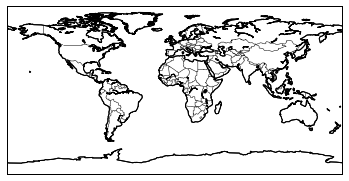

In [16]:
# Get list of of coastline and country lon/lat traces
traces_cc1 = get_coastline_traces()+get_country_traces()
# Get list of of coastline (no country)
traces_cc2 = get_coastline_traces()

In [17]:
fig = plt.figure(1, figsize=(8, 4))
ax=plt.subplot(111)


m = Basemap()
#m = Basemap(projection='ortho',lat_0=0,lon_0=0,resolution='l')     
#m = Basemap(projection='moll',lon_0=0,resolution='l')     
# Shift 'lon' from [0,360] to [-180,180], make numpy array
tmp_lon = np.array([lon[n]-360 if l>=180 else lon[n] 
                   for n,l in enumerate(lon)])  # => [0,180]U[-180,2.5]

i_east, = np.where(tmp_lon>=0)  # indices of east lon
i_west, = np.where(tmp_lon<0)   # indices of west lon
lon = np.hstack((tmp_lon[i_west], tmp_lon[i_east]))  # stack the 2 halves

# Correspondingly, shift the 'air' array
tmp_air = np.array(air)
air = np.hstack((tmp_air[:,i_west], tmp_air[:,i_east]))
poly_paths = m.drawcoastlines().get_paths() # coastline polygon paths
X,Y = np.meshgrid(lon,lat)

m.contourf(X, Y, air, 40, alpha=.75, cmap='jet')
#ticks=range(-90,90,30)
#ax.set_yticks(ticks)

#ax.set_ylabel("Latitude", fontsize=16)
#ax.set_xlabel("Longitude", fontsize=16)
plt.colorbar()

# D3 Works!
mpld3.display(fig)
#mpld3.save_html(fig,'mpld3_contour_test.html')

In [18]:
fig = plt.figure(1, figsize=(8, 4))
ax=plt.subplot(111)


m = Basemap(projection='ortho',lat_0=0,lon_0=0,resolution='l')     
# Shift 'lon' from [0,360] to [-180,180], make numpy array
tmp_lon = np.array([lon[n]-360 if l>=180 else lon[n] 
                   for n,l in enumerate(lon)])  # => [0,180]U[-180,2.5]

i_east, = np.where(tmp_lon>=0)  # indices of east lon
i_west, = np.where(tmp_lon<0)   # indices of west lon
lon = np.hstack((tmp_lon[i_west], tmp_lon[i_east]))  # stack the 2 halves

# Correspondingly, shift the 'air' array
tmp_air = np.array(air)
air = np.hstack((tmp_air[:,i_west], tmp_air[:,i_east]))
poly_paths = m.drawcoastlines().get_paths() # coastline polygon paths
#X,Y = np.meshgrid(lon,lat)
# compute native map projection coordinates of lat/lon grid.
nlats = lat.shape[0]; nlons = lon.shape[0]; delta = 2.*np.pi/(lon.shape[0]-1)

lats = (0.5*np.pi-delta*np.indices((nlats,nlons))[0,:,:])
lons = (delta*np.indices((nlats,nlons))[1,:,:])

x, y = m(lons*180./np.pi, lats*180./np.pi)
m.contourf(x, y, air, 40, alpha=.75, cmap='jet')
#ticks=range(-90,90,30)
#ax.set_yticks(ticks)

#ax.set_ylabel("Latitude", fontsize=16)
#ax.set_xlabel("Longitude", fontsize=16)
plt.colorbar()

mpld3.display(fig)
#mpld3.save_html(fig,'mpld3_contour_test.html')